In [1]:
from pathlib import Path
import requests
urls = {
    'main_pdf': 'https://raw.githubusercontent.com/vertical-cloud-lab/custom-induction-furnace/aa23a90/real_person_paper.pdf',
    'si_pdf': 'https://raw.githubusercontent.com/vertical-cloud-lab/custom-induction-furnace/aa23a90/paper/SI.pdf',
}
headers={'User-Agent':'Mozilla/5.0 manuscript-review'}
for name, url in urls.items():
    out = Path('/workspace') / f'{name}.pdf'
    r = requests.get(url, headers=headers, allow_redirects=True, timeout=120)
    r.raise_for_status()
    assert r.content[:4] == b'%PDF', (name, r.headers.get('content-type'), r.content[:50])
    out.write_bytes(r.content)
    print(name, r.status_code, len(r.content), out)


main_pdf 200 11995911 /workspace/main_pdf.pdf


si_pdf 200 10858500 /workspace/si_pdf.pdf


In [2]:
from pathlib import Path
for fn in ['real_person_paper_text.txt','SI_text.txt']:
    text=Path('/workspace',fn).read_text(errors='replace')
    print('\n###',fn,'chars',len(text),'lines',text.count('\n')+1)
    print(text[:3000])



### real_person_paper_text.txt chars 43899 lines 455
Retrofitting a commercial RF induction generator into a computer-controlled,
vacuum-integrated annealing system for reactive-metal grain growth
        Sterling G. Baird, Ryan Weber, Christopher Nyborg, Ronnie Guymon, Gage Erickson, and Oliver Johnson
        Department of Mechanical Engineering, Brigham Young University, Provo, Utah 84602,
        USA
        (Dated: 24 July 2026)
        High-temperature vacuum annealing near a metal’s melting point drives controlled grain growth, but it nor-
        mally requires an expensive turn-key vacuum induction furnace. We describe an open retrofit (added control,
        vacuum, and temperature-feedback hardware and software) that converts a bare commercial radiofrequency
        (RF) induction generator into a computer-controlled, vacuum-integrated annealing system with pyrometer
        feedback. The retrofit consists of analog power control through LabVIEW and a data-acquisition (DAQ)

In [3]:
from pathlib import Path
import re
for fn in ['real_person_paper_text.txt','SI_text.txt']:
    lines=Path('/workspace',fn).read_text(errors='replace').splitlines()
    print('\n',fn)
    for i,l in enumerate(lines,1):
        if re.match(r'^(I|V|S?I|S?V|Figure|Table|FIG\.|S\d)', l.strip()) or '\f' in l:
            if l.strip(): print(f'{i}: {l[:180]}')



 real_person_paper_text.txt
28: I.   INTRODUCTION                                             erator internals are not reproduced, so a compatible gen-
56:                                                               II.   SYSTEM DESIGN AND DESCRIPTION
77: FIG. 1. The annealing system. (a) System overview. The generator drives the liquid-cooled heating head and work coil
169: III.   CONSTRUCTION AND OPERATION                             that admits gas in a controlled way rather than dump-
188:                                                                   FIG. 3. Raw EBSD Kikuchi pattern from a furnace-annealed
190: IV.   PERFORMANCE VALIDATION
232: V.    MICROSTRUCTURAL VALIDATION
233:                                                                     Figure 6 shows the microstructure such an anneal pro-
245: FIG. 4. EBSD inverse-pole-figure (IPF) orientation maps of
259: FIG. 5. Grain-boundary thermal grooving on a Ni (4N5) spec-
308: FIG. 8.      Sample-assembly configuration

In [4]:
from pathlib import Path
import re, statistics, math
main=Path('/workspace/real_person_paper_text.txt').read_text()
si=Path('/workspace/SI_text.txt').read_text()
# Recompute SI repeatability and BOM subtotals relevant to quantitative findings.
repeat=[1199.8,1201.5,1204.2,1200.6,1201.2,1201.0,1200.3,1200.9]
print('repeatability mean, sample SD, CV%:', statistics.mean(repeat), statistics.stdev(repeat), statistics.stdev(repeat)/statistics.mean(repeat)*100)
# Explicit fixed GEN subtotal and exact nonoptional numeric total entries from SI table, excluding optional range and unpriced items.
vals=[8240,1670,1575,3337,1665,281,385,51,3755,13573.65,1543.29,652.80,38,19,48.24,11.25,60,15.84,129.78,54,19,66,67,99,108,91,124,57]
print('listed fixed-price total (using about-values as stated):',sum(vals))
print('fraction of claimed commercial range low/high:',sum(vals)/50000,sum(vals)/200000)
# Calibration implied command values
for T in [1200,1250,1300,1400]: print(T,(T-931)/632)
# Locate key exact phrases in current docs
phrases=['minor modifications to the sample assembly','relative to the pyrometer','provisional:','high-purity annealing environment','more than one hundred logged anneals','small fraction of turn-key cost','every failure mode','10−6 to 10−8 Torr']
for p in phrases:
    for fn,text in [('main',main),('SI',si)]:
        if p.lower() in text.lower(): print(fn,p,'FOUND')


repeatability mean, sample SD, CV%: 1201.1875 1.3281969518325283 0.1105736574708385
listed fixed-price total (using about-values as stated): 37735.85
fraction of claimed commercial range low/high: 0.754717 0.18867925
1200 0.42563291139240506
1250 0.504746835443038
1300 0.5838607594936709
1400 0.7420886075949367
main minor modifications to the sample assembly FOUND
main provisional: FOUND
main 10−6 to 10−8 Torr FOUND


In [5]:
from e14c.web import fetch_parsed_page
urls=[
'https://www.ni.com/docs/en-US/bundle/usb-6000-specs/page/specs.html',
'https://www.ni.com/en/shop/hardware/current/model-ni-9265',
'https://www.ni.com/docs/en-US/bundle/ni-9203-specs/page/specs.html'
]
for u in urls:
    try:
        t=await fetch_parsed_page(u)
        print('\nURL',u,'\n',t[:1200].replace('\n',' '))
    except Exception as e: print('ERR',u,e)



URL https://www.ni.com/docs/en-US/bundle/usb-6000-specs/page/specs.html 
 Product Documentation - NI   * [Return to Home Page](https://www.ni.com/en.html) *  *  * + [Solutions](https://www.ni.com/en/solutions.html) Industries          - [Academic and Research](https://www.ni.com/en/solutions/academic-research.html)         - [Aerospace, Defense, and Government](https://www.ni.com/en/solutions/aerospace-defense.html)         - [Electronics](https://www.ni.com/en/solutions/electronics.html)         - [Energy](https://www.ni.com/en/solutions/energy.html)         - [Industrial Machinery](https://www.ni.com/en/solutions/industrial-machinery.html)         - [Life Sciences](https://www.ni.com/en/solutions/life-sciences.html)         - [Semiconductor](https://www.ni.com/en/solutions/semiconductor.html)         - [Transportation](https://www.ni.com/en/solutions/transportation.html) Product Life Cycles          - [Design and Prototype](https://www.ni.com/en/solutions/design-prototype.html)     


URL https://www.ni.com/en/shop/hardware/current/model-ni-9265 
 NI-9265 - NI  * [Return to Home Page](https://www.ni.com/en.html) *  *  * + [Solutions](https://www.ni.com/en/solutions.html) Industries          - [Academic and Research](https://www.ni.com/en/solutions/academic-research.html)         - [Aerospace, Defense, and Government](https://www.ni.com/en/solutions/aerospace-defense.html)         - [Electronics](https://www.ni.com/en/solutions/electronics.html)         - [Energy](https://www.ni.com/en/solutions/energy.html)         - [Industrial Machinery](https://www.ni.com/en/solutions/industrial-machinery.html)         - [Life Sciences](https://www.ni.com/en/solutions/life-sciences.html)         - [Semiconductor](https://www.ni.com/en/solutions/semiconductor.html)         - [Transportation](https://www.ni.com/en/solutions/transportation.html) Product Life Cycles          - [Design and Prototype](https://www.ni.com/en/solutions/design-prototype.html)         - [Validation](https:


URL https://www.ni.com/docs/en-US/bundle/ni-9203-specs/page/specs.html 
 NI-9203 Specifications - NI   * [Return to Home Page](https://www.ni.com/en.html) *  *  * + [Solutions](https://www.ni.com/en/solutions.html) Industries          - [Academic and Research](https://www.ni.com/en/solutions/academic-research.html)         - [Aerospace, Defense, and Government](https://www.ni.com/en/solutions/aerospace-defense.html)         - [Electronics](https://www.ni.com/en/solutions/electronics.html)         - [Energy](https://www.ni.com/en/solutions/energy.html)         - [Industrial Machinery](https://www.ni.com/en/solutions/industrial-machinery.html)         - [Life Sciences](https://www.ni.com/en/solutions/life-sciences.html)         - [Semiconductor](https://www.ni.com/en/solutions/semiconductor.html)         - [Transportation](https://www.ni.com/en/solutions/transportation.html) Product Life Cycles          - [Design and Prototype](https://www.ni.com/en/solutions/design-prototype.html)     

/workspace/si_pages_6_10.png


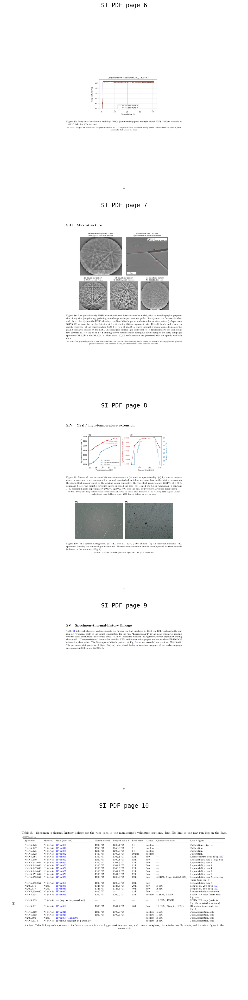

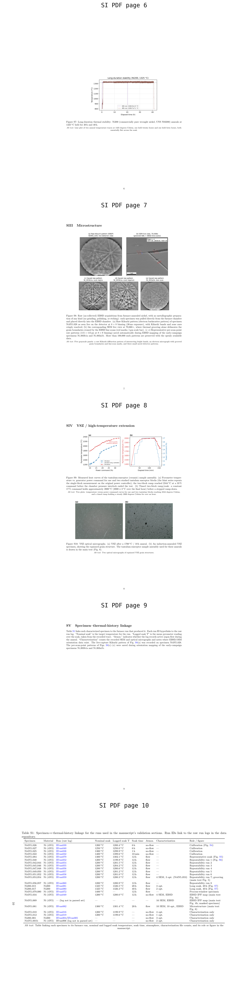

In [6]:
import fitz, matplotlib.pyplot as plt
from pathlib import Path
pdf=fitz.open('/workspace/si_pdf.pdf')
fig, axes=plt.subplots(5,1,figsize=(14,38))
for ax,pno in zip(axes,range(5,10)):
    pix=pdf[pno].get_pixmap(matrix=fitz.Matrix(1.4,1.4), alpha=False)
    import numpy as np
    img=np.frombuffer(pix.samples,dtype=np.uint8).reshape(pix.height,pix.width,pix.n)
    ax.imshow(img); ax.set_title(f'SI PDF page {pno+1}',fontsize=16); ax.axis('off')
plt.tight_layout()
out='/workspace/si_pages_6_10.png'; plt.savefig(out,dpi=110,bbox_inches='tight'); print(out)
from IPython.display import display, Image
display(Image(out))


In [7]:
import requests
for doi in ['10.1201/9781420028904','10.1201/9781420019490']:
    r=requests.get('https://api.crossref.org/works/'+doi,timeout=30); r.raise_for_status(); m=r.json()['message']
    print(doi, m.get('type'), m.get('title'), m.get('publisher'), m.get('published-print') or m.get('published'))


10.1201/9781420028904 book ['Handbook of Induction Heating'] CRC Press {'date-parts': [[2002, 12, 17]]}


10.1201/9781420019490 monograph ['Optimal Control of Induction Heating Processes'] CRC Press {'date-parts': [[2006, 7, 7]]}


In [8]:
from pathlib import Path
report = r'''# Fresh three-pass AI-edit review of the current manuscript and SI

**Documents reviewed:** current 8-page main-text PDF and `real_person_paper_text.txt`; current 13-page SI PDF and `SI_text.txt`. The two prior reports were consulted only after the independent sweep, solely to assign **NEW** versus **STILL-OPEN**.

## 1. Factual contradictions and unsupported capability claims

### 1. **STILL-OPEN**: the command variable is mislabeled as mA
- **Location:** Main p. 4, Sec. IV; SI p. 4, Fig. S4; main p. 2, Sec. II.
- **Quote:** “The relation is well described by T = 931 + 632 I, with T in °C and I in mA” and “Soak-mean analog power command (mA),” versus “the conditioner’s 4–20 mA output drives the generator’s power-setpoint input.”
- **Problem:** The fit implies 0.426–0.742 mA over 1200–1400 °C, below the stated loop’s 4 mA live zero. Fig. S5 also plots a different apparent command scale near 1.5 mA, while Fig. S9 uses percent.
- **Severity:** `referee-flag`
- **Action:** Identify the logged variable and units (fraction, percent, volts, conditioned current, or something else), then relabel the equation, Figs. S4–S5, and the signal-chain description consistently.

### 2. **STILL-OPEN**: 2500 °C/45 min exceeds the supplied thermal evidence
- **Location:** Main p. 1, abstract; p. 3, Sec. II; p. 5, Sec. V.A and Fig. 7; p. 6, Conclusions; SI p. 8, Fig. S9; SI pp. 9–10, Table S1.
- **Quote:** “coarsening yttria-stabilized zirconia (YSZ) grains in 45 min at 2500 °C” versus “the two-block ramp reached 2344 °C at a 33 % command before the chamber pressure interlock ended the test.”
- **Problem:** The best supplied trace reaches 2344 °C, the demonstrated hold is ~2000 °C, and Table S1 contains no YSZ run linking the 2500 °C/45 min claim to a log.
- **Severity:** `referee-flag`
- **Action:** Add the 2500 °C run trace, temperature basis, specimen/run ID, and Table S1 linkage, or reduce the capability claim to the documented evidence.

### 3. **STILL-OPEN**: 1500 °C metal capability is not demonstrated
- **Location:** Main p. 1, Introduction; p. 3, Sec. II.
- **Quote:** “Growing grains without oxidizing the sample requires temperatures of 1400 to 1500 °C” and “Metal charges in the graphite crucible reach the nickel and iron grain-growth range of 1400 to 1500 °C.”
- **Problem:** The hottest linked nickel data are 1400 °C; no 1500 °C run is shown.
- **Severity:** `referee-flag`
- **Action:** State “up to 1400 °C demonstrated” or provide a linked hotter run.

### 4. **STILL-OPEN**: the abstract attributes full-thickness spanning to grooves
- **Location:** Main p. 1, abstract; p. 4, Sec. V; p. 5, Fig. 5; p. 6, Conclusions.
- **Quote:** “deep thermal grooves, several spanning the full sheet thickness” versus “Several grain boundaries traverse the full sheet thickness.”
- **Problem:** The modifier “several spanning” grammatically refers to grooves, but the body, image, and caption support full-thickness grain boundaries.
- **Severity:** `referee-flag`
- **Action:** Change the abstract to distinguish the grooves from the full-thickness boundaries.

### 5. **STILL-OPEN**: the BN-barrier explanation conflicts with Fig. 8
- **Location:** Main p. 5, Sec. V.A; p. 6, Fig. 8.
- **Quote:** “direct contact between graphite and alumina was eliminated ... by introducing a boron nitride diffusion barrier” and “Alternatively, replacing the graphite with tantalum avoids this compatibility issue,” versus “The blocks rest on a boron nitride stub ... [that] prevents reaction between the tantalum and the alumina support tube below.”
- **Problem:** The prose presents BN as a graphite–alumina barrier and tantalum as the alternative; Fig. 8 places BN in the tantalum–alumina stack.
- **Severity:** `referee-flag`
- **Action:** State which material pairs BN separated in each tested configuration and why tantalum still required BN.

### 6. **STILL-OPEN**: the YSZ comparison uses different endpoints without explaining comparability
- **Location:** Main p. 5, Sec. V.A and Fig. 7.
- **Quote:** “grain growth from approximately 10 µm to 80 µm required over 228 h at 1600 °C ... whereas the induction furnace coarsened grains from approximately 20 µm to 90 µm in only 45 min at 2500 °C.”
- **Problem:** The starting and final grain sizes differ, yet the runs are presented as a direct time comparison. The revision changed the box-furnace endpoint from 90 to 80 µm but did not explain specimen/batch comparability.
- **Severity:** `referee-flag`
- **Action:** Identify the specimens/batches and measurement method; describe the comparison as approximate if the initial states differ.

### 7. **STILL-OPEN**: Fig. 7 does not quantitatively establish a 90 µm grain size
- **Location:** Main p. 5, Fig. 7 and Sec. V.A.
- **Quote:** “coarsened the grains from approximately 20 to 90 µm. The red traces are the microscope software’s multi-grain size measurements.”
- **Problem:** The visible red annotations are multi-grain intercept lengths (~384–866 µm), but no intercept count, conversion, field count, sample size, dispersion, or uncertainty is reported.
- **Severity:** `referee-flag`
- **Action:** Report the grain-size standard/method, conversion from multi-grain intercept to grain size, number of fields and grains, and a summary with uncertainty; otherwise soften the 90 µm claim.

### 8. **STILL-OPEN**: run-linkage promises remain broader than Table S1
- **Location:** Main p. 4, Sec. IV; p. 5, Fig. 4; SI pp. 9–10, Table S1.
- **Quote:** “The supplementary material links each result below to its underlying run log” and “The supplementary material links each specimen to its furnace run,” versus “Ni4N5 069 ... — (log not in parsed set).”
- **Problem:** At least the Fig. 4(b) specimen lacks a surviving linked log.
- **Severity:** `referee-flag`
- **Action:** Qualify the promise (“where the log survives”) or restore the missing log/link.

### 9. **STILL-OPEN**: “more than one hundred logged anneals” is not auditable here
- **Location:** Main p. 4, Sec. IV; SI pp. 9–10, Table S1.
- **Quote:** “The furnace has completed more than one hundred logged anneals” and “Table S1 ... for the runs used in the manuscript’s validation sections.”
- **Problem:** The selective table contains fewer than two dozen rows and some missing logs; the supplied package gives no complete run manifest supporting the count.
- **Severity:** `confusing`
- **Action:** Link a complete run index or explicitly identify the repository manifest from which the count is obtained.

### 10. **STILL-OPEN**: “high-purity” is not operationally demonstrated
- **Location:** Main p. 6, Conclusions; p. 2, Sec. II and Fig. 1.
- **Quote:** “The full system and workflow deliver a high-purity annealing environment.”
- **Problem:** Pressure, argon flow, and EBSD indexability are shown, but gas purity, oxygen partial pressure, residual-gas analysis, leak rate, or post-anneal chemistry is not reported.
- **Severity:** `referee-flag`
- **Action:** Use a directly supported description such as “low-oxygen” or define and measure “high-purity.”

### 11. **STILL-OPEN**: the ratio-pyrometer claim is too broad
- **Location:** Main p. 2, Sec. II; p. 4, Sec. IV.
- **Quote:** “robust to emissivity changes” versus “absolute specimen temperature still depends on emissivity and surface condition.”
- **Problem:** The first statement reads as unconditional, while the later statement acknowledges emissivity dependence.
- **Severity:** `confusing`
- **Action:** Qualify the benefit as reduced sensitivity under ratio-pyrometry assumptions, including wavelength-dependent emissivity and optical-path effects.

### 12. **STILL-OPEN**: the cost comparison remains underdefined
- **Location:** Main p. 1, Introduction; p. 6, Conclusions; SI pp. 11–12, Table S2.
- **Quote:** “The cost of the entire system totals to about $38.75k” and “directly reusable at a small fraction of turn-key cost,” versus “$50k to $200k or more.”
- **Problem:** Summing the listed fixed/approximate non-optional entries gives ~$37,735.85 before shipping, tax, and unpriced tantalum/BN; $38.75k appears to include roughly the top of the optional MFC range. Even $38.75k is 77.5% of the $50k lower comparator, not plainly a “small fraction.”
- **Severity:** `referee-flag`
- **Action:** Give a transparent as-built subtotal, optional/unpriced exclusions, and a range; replace “small fraction” with the actual percentage range or a narrower comparator.

### 13. **NEW**: broad resistive-furnace comparison is unsupported and overgeneralized
- **Location:** Main p. 1, Introduction.
- **Quote:** “Resistive tube and box furnaces do not heat the charge directly. They heat only by radiation from the furnace elements, so heat transfer into the charge is limited, and they reach lower temperatures with slower ramps.”
- **Problem:** Tube/box furnaces can transfer heat by radiation, convection, and conduction through fixtures/atmosphere, and their attainable temperature/ramp rate depends on design; no citation or defined comparator supports the universal claim.
- **Severity:** `referee-flag`
- **Action:** Narrow the comparison to the specific commercial systems considered and cite specifications, or remove the universal mechanism/performance claim.

### 14. **NEW**: citations 12–13 do not plausibly support the vent-valve claim
- **Location:** Main p. 2, Sec. II; main p. 7, Refs. 12–13.
- **Quote:** “An automated, electrically triggered vent valve fed from an inert-gas regulator allows controlled venting and backfilling12,13.” The cited titles are “Development of high-temperature and low-oxygen atmosphere controlled furnace...” and “Effects of the annealing conditions on the oxidation behavior of fe-36ni alloys.”
- **Problem:** Neither title indicates support for this specific valve hardware or controlled-venting mechanism; Ref. 13 is about alloy oxidation.
- **Severity:** `confusing`
- **Action:** Cite the valve datasheet/system documentation for the hardware claim; retain atmosphere papers only where they support atmosphere effects.

### 15. **STILL-OPEN**: two CRC Press books remain labeled “ArXiv”
- **Location:** Main pp. 7–8, Refs. 8 and 20.
- **Quote:** “Handbook of induction heating, ArXiv (2017), 10.1201/9781420028904” and “Optimal control of induction heating processes, ArXiv (2006), 10.1201/9781420019490.”
- **Problem:** Crossref identifies DOI 10.1201/9781420028904 as a 2002 CRC Press book and DOI 10.1201/9781420019490 as a CRC Press monograph, not ArXiv records.
- **Severity:** `referee-flag`
- **Action:** Correct document type, publisher, and year from authoritative DOI metadata.

## 2. Nonsensical or garbled sentences

### 16. **NEW**: clear deletion/splice fragment
- **Location:** Main p. 5, Sec. V.A.
- **Quote:** “the induction furnace coarsened grains from approximately 20 µm to 90 µm in only 45 min at 2500 °C (Fig. 7). minor modifications to the sample assembly (Fig. 8).”
- **Problem:** “minor modifications...” is a lowercase sentence fragment with no predicate or grammatical attachment.
- **Severity:** `referee-flag`
- **Action:** Restore the missing clause or delete the fragment.

### 17. **STILL-OPEN**: sapphire-transmittance sentence has no coherent comparison
- **Location:** Main p. 3, Sec. II.A.
- **Quote:** “Sapphire is used for the window to increase transmittance in the wavelength ranges emitted from the sample relative to the pyrometer.”
- **Problem:** “relative to the pyrometer” has no valid comparison target, and the sample emits a spectrum rather than “wavelength ranges” selected relative to an instrument.
- **Severity:** `confusing`
- **Action:** If accurate, state that sapphire transmits the wavelength bands measured by the pyrometer; otherwise ask the authors to specify the intended optical comparison.

### 18. **STILL-OPEN**: the flange-topology sentence joins the wrong objects
- **Location:** Main p. 3, Sec. II.
- **Quote:** “The quartz tube and the vacuum hardware below it are joined by KF40 flanges to the pyrometer housing.”
- **Problem:** Grammatically, both the tube and lower vacuum hardware join the upper housing; Fig. 1 shows the tube between the housing and lower vacuum hardware.
- **Severity:** `confusing`
- **Action:** Describe the upper and lower joints separately.

### 19. **STILL-OPEN**: wrong preposition in the ceramic mechanism sentence
- **Location:** Main p. 5, Sec. V.A.
- **Quote:** “At the temperatures required for grains to coarsen on refractory ceramics...”
- **Problem:** Grains coarsen **in** a ceramic; “on” implies surface deposits.
- **Severity:** `polish`
- **Action:** Change “on” to “in.”

### 20. **STILL-OPEN**: “such an anneal” points to the wrong condition
- **Location:** Main p. 4, Sec. V.
- **Quote:** “Figure 6 shows the microstructure such an anneal produces for a Ni (4N5) specimen soaked 20 h at 1300 °C...”
- **Problem:** The immediately preceding anneal is 1200 °C/12 h, while Fig. 6 is 1300 °C/20 h.
- **Severity:** `confusing`
- **Action:** Replace “such an anneal” with the explicit 1300 °C/20 h condition.

### 21. **STILL-OPEN**: visible draft placeholder in author contributions
- **Location:** Main p. 7, Author Contributions.
- **Quote:** “— provisional: Sterling G. Baird: Conceptualization, Software, Investigation, Writing – original draft.”
- **Problem:** “provisional” and the leading dash are unresolved submission residue.
- **Severity:** `referee-flag`
- **Action:** Finalize the CRediT roles and remove the placeholder.

### 22. **NEW**: visible draft-state licensing statement
- **Location:** SI p. 13, Sec. SVII.
- **Quote:** “The control and analysis code carries an MIT license and the hardware design files carry a CERN-OHL-S license, both proposed pending final adoption.”
- **Problem:** “carries” states that the licenses apply, while “proposed pending final adoption” says they do not yet apply; this is unresolved repository/legal metadata.
- **Severity:** `referee-flag`
- **Action:** Adopt and name the licenses before submission, or state accurately that licensing is not yet finalized.

## 3. Author-check questions: physical configuration and suspicious specifics

These are required author-verification items, not assertions that the configuration is wrong.

### 23. **STILL-OPEN**: sample-support load path
- **Location:** Main p. 3, Sec. II and Sec. II.A; p. 6, Fig. 8.
- **Quote:** “The sample assembly is not attached to any of these flanges. It simply sits inside the quartz tube, resting on a retaining ring of a KF40 flange,” versus “the crucible rests on an alumina support tube ... [whose] lower end rests on top of a Teflon tube at the KF40 fitting below.”
- **Problem:** The adjacent support descriptions do not identify one unambiguous load path.
- **Severity:** `confusing`
- **Action:** Which object contacts the retaining ring: sample assembly, alumina tube, or Teflon tube? Give one bottom-to-top load path.

### 24. **STILL-OPEN**: installed DAQ model and signal chain
- **Location:** Main p. 2, Sec. II; SI p. 11, Table S2, RETRO-1 and RETRO-4.
- **Quote:** “the DAQ device’s 0–5 V analog output drives a voltage-to-current loop conditioner,” “NI USB-6000 DAQ,” and “NI-9265 input module + NI-9203 output module + NI cDAQ-9174 chassis.”
- **Problem:** NI documents the USB-6000 without analog output; NI-9265 is current output and NI-9203 current input, the reverse of the table. The actual installed wiring cannot be reconstructed.
- **Severity:** `referee-flag`
- **Action:** Inspect the installed labels/wiring and provide the exact command source, chassis/modules, channel directions, loop supply, conditioner, generator input, and logged variable. Do not silently substitute a likely model.

### 25. **STILL-OPEN**: coil dimensions versus fabrication drawing
- **Location:** Main p. 1, Sec. II; SI p. 2, Fig. S2.
- **Quote:** “approximately 3 in tall with a 2.5 in inner diameter and 6.5 turns,” versus drawing callouts “86.2” mm and “Ø59.85” mm.
- **Problem:** The drawing corresponds to ~3.39 in height and ~2.36 in ID; the height difference is large for a reproducibility dimension.
- **Severity:** `referee-flag`
- **Action:** Confirm whether Fig. S2 is the installed coil and reconcile the text with the drawing.

### 26. **STILL-OPEN**: 0.5 psi relief-valve provenance
- **Location:** Main p. 3, Sec. III; SI p. 3, Fig. S3; SI p. 12, Table S2 RETRO-12.
- **Quote:** “a 0.5 psi overpressure relief valve” and “the relief valve used in this build was supplied by the BYU project support center.”
- **Problem:** The documents do not identify a model, datasheet, or calibration supporting the cracking pressure of the installed valve.
- **Severity:** `referee-flag`
- **Action:** What record establishes 0.5 psi for the installed valve, and is that setpoint safely below the quartz assembly’s allowable differential pressure?

### 27. **STILL-OPEN**: exact tantalum-block dimension
- **Location:** Main p. 6, Fig. 8.
- **Quote:** “two 25.5 mm tantalum susceptor blocks.”
- **Problem:** The schematic labels 25.5 mm across the block width; the caption does not state which dimension is 25.5 mm or give block height.
- **Severity:** `confusing`
- **Action:** State all block dimensions or explicitly say “25.5 mm wide.”

### 28. **STILL-OPEN**: unexplained Fig. S10 provenance
- **Location:** SI p. 8, Fig. S10.
- **Quote:** “(a) YSZ after a 1700 °C / 10 h anneal. (b) An induction-annealed YSZ specimen ... The tantalum-susceptor sample assembly used for these anneals...”
- **Problem:** Panel (a)’s furnace/run is unidentified; panel (b) has no temperature or duration; “these anneals” asserts common assembly provenance without separate linkage.
- **Severity:** `referee-flag`
- **Action:** Give specimen, furnace, run ID, temperature, duration, atmosphere, and assembly for each panel.

### 29. **STILL-OPEN**: 13 mm assembled crucible height
- **Location:** SI p. 1, Fig. S1.
- **Quote:** “Fully assembled the crucible stands 13 mm tall.”
- **Problem:** The listed body/lid step dimensions do not determine assembled height without seating depth, and the figure does not show an assembled-height measurement.
- **Severity:** `confusing`
- **Action:** Confirm from a direct measurement or dimensioned section, or remove the value.

### 30. **STILL-OPEN**: overprecise SEM magnification
- **Location:** SI p. 7, Fig. S8.
- **Quote:** “the corresponding SEM live view at 70,068×.”
- **Problem:** The six-significant-digit magnification is suspiciously precise unless copied from acquisition metadata and meaningful after export/resizing.
- **Severity:** `polish`
- **Action:** Confirm its provenance; otherwise round it and rely on the 1 µm scale bar.

### 31. **STILL-OPEN**: universal failure-mode claim
- **Location:** Main p. 6, Conclusions.
- **Quote:** “Every failure mode was a contact reaction among the charge, the susceptor, and the support materials.”
- **Problem:** The manuscript shows one reaction mechanism; “every” depends on the unpublished/full configuration survey.
- **Severity:** `confusing`
- **Action:** Confirm against the complete failure log and cite it, or change to “The failures documented here...”

### 32. **NEW**: verify all remaining configuration claims as a single reproducibility checklist
- **Location and verbatim claims:** Main p. 2, Sec. II: “Ethylene glycol coolant flows in series from the chiller through the generator and then through the heating head and work coil before returning to the chiller”; “The tube connects through a KF40 flange ... and a flexible bellows to a compact turbopumping station”; “The turbopump can be left running during backfilled operation or stopped”; “a constant argon flow of 20 SCCM was then maintained”; “with the chamber evacuated and then filled with argon while the turbopump was running.” Main p. 3, Secs. II–III: “the pyrometer housing ... is suspended from the ceiling by cables”; “a 55 mm quartz optical disc pressed against an O-ring”; “Every flanged joint compresses an elastomer O-ring”; “The roughing pump sits on a separate support, mechanically decoupled”; “the argon regulator feeds the automated, electrically triggered vent valve”; “A mass flow controller between them is helpful.” Main p. 3, Sec. II.A: “The specimen is sandwiched between two alumina discs”; “a sapphire window closes the lid bore”; “the crucible rests on an alumina support tube”; “The tube has holes bored laterally ... to aid evacuation”; “its lower end rests on top of a Teflon tube.” Main p. 6, Fig. 8: “A YSZ specimen is sandwiched between two ... tantalum susceptor blocks”; “The blocks rest on a boron nitride stub”; “The coil, vacuum, pyrometer, and control paths are unchanged from the metal configuration.”
- **Problem:** The prompt requires every physical-configuration statement to be author-checked even when it appears plausible. Figures 1, 2, 8, S1, and S3 visually support several of these, but the PDFs cannot verify hidden plumbing order, seals, flow state, materials, or operating procedure.
- **Severity:** `confusing`
- **Action:** Authors should check each quoted statement against the as-built apparatus, wiring/plumbing diagrams, part records, and run logs. In particular, distinguish “used in reported runs” from “possible operating mode.”

## 4. Terminology and cross-reference issues

### 33. **STILL-OPEN**: “only requirement” is too absolute and repeated
- **Location:** Main p. 1, abstract and Introduction; p. 6, Conclusions.
- **Quote:** “Because its only requirement is a monotonic analog power-control input” and “Because the retrofit requires only a monotonic analog power-control input...”
- **Problem:** Transfer also requires re-establishing “command scaling, calibration, PID gains, alignment, and interlock behavior,” plus compatible power, coil/cooling, sensing, and isolation. The same claim appears three times.
- **Severity:** `confusing`
- **Action:** Use “only generator-control interface requirement” if that is the intended scope, state the other compatibility requirements once, and trim repetition.

### 34. **NEW**: “fixed-geometry” drifts from the actual fixed configuration
- **Location:** Main p. 1, abstract; p. 4, Sec. IV; SI p. 4, Fig. S4.
- **Quote:** “a fixed-geometry power–temperature calibration” versus “one fixed configuration of Ni (4N5) specimen, quartz tube, graphite crucible, and optics.”
- **Problem:** Specimen identity/material and optical configuration are not merely geometry; “fixed-geometry” understates what must remain fixed for the calibration.
- **Severity:** `confusing`
- **Action:** Use “fixed-configuration” consistently and list the controlled elements once.

### 35. **STILL-OPEN**: decreasing vacuum range is written backwards
- **Location:** Main pp. 2–3, Secs. II–III.
- **Quote:** “10−6 to 10−8 Torr” and “the 10−6 to 10−8 Torr operating vacuum.”
- **Problem:** The range is given from larger to smaller pressure, which reads backwards.
- **Severity:** `polish`
- **Action:** Write “10−8 to 10−6 Torr” or “down to 10−8 Torr,” as appropriate.

### 36. **NEW**: “original power controller” has no defined counterpart
- **Location:** SI p. 8, Fig. S9.
- **Quote:** “the faint series repeats the single-block measurement on the original power controller.”
- **Problem:** No replacement controller is identified, so “original” has no clear contrast and may imply datasets taken on different control hardware.
- **Severity:** `confusing`
- **Action:** Name both controller configurations and explain whether command scales are comparable.

### 37. **NEW**: Table S2 reverses generic “input/output” nomenclature in addition to the hardware error
- **Location:** SI p. 11, Table S2 RETRO-4.
- **Quote:** “NI-9265 input module + NI-9203 output module.”
- **Problem:** Beyond needing an author hardware check, this is a concrete terminology reversal: manufacturer documentation identifies the NI-9265 as current output and NI-9203 as current input.
- **Severity:** `referee-flag`
- **Action:** Correct the module roles after verifying the installed parts.

## 5. Style and repetition

### 38. **STILL-OPEN**: no-preparation claim is repeated nearly verbatim
- **Location:** Main p. 4, Fig. 3 and Sec. V; p. 5, Fig. 4; p. 6, Conclusions; SI p. 7, Fig. S8.
- **Quote:** “no grinding, polishing, or etching” and “pulled directly from the furnace chamber and placed directly into the EBSD chamber.”
- **Problem:** The wording recurs four or more times, including the “directly ... directly” stutter.
- **Severity:** `polish`
- **Action:** Keep complete standalone captions, but shorten the body and conclusion versions and remove one “directly” per sentence.

### 39. **STILL-OPEN**: full-thickness and hand-clamp claims are over-repeated
- **Location:** Main pp. 1, 4–6, abstract/Sec. V/Fig. 5/Conclusions; pp. 2–3 and 6, Fig. 1/Sec. III/Conclusions.
- **Quote:** “span the full sheet thickness” / “traverse the full sheet thickness”; “hand-clamped” / “hand-tightened clamps.”
- **Problem:** Each claim appears three or more times with little added information.
- **Severity:** `polish`
- **Action:** Keep the figure-caption occurrence and one interpretive body/conclusion occurrence; cut the rest.

### 40. **NEW**: awkward cost phrasing
- **Location:** Main p. 1, Introduction.
- **Quote:** “The cost of the entire system totals to about $38.75k.”
- **Problem:** “totals to” is nonidiomatic in formal prose.
- **Severity:** `polish`
- **Action:** Use “The entire system cost about $38.75k” after reconciling the accounting in Finding 12.

## Confirmed-fixed items from the older reports

- The former statement that all reported nickel anneals used continuous flow now says “Many of the reported nickel grain-growth anneals ran under this continuous flow,” consistent with Table S1’s mixture of flow and no-flow runs.
- “a cup body and a lidded cap” is now “a cup body and a lid.”
- The coil sentence now says the geometry fits the “vacuum chamber geometry,” not “sample geometry.”
- The former “Unknown journal” placeholder for the Suleiman item is now a Ph.D. thesis citation with institution and location.
- “USA-sourced” has been removed.
- The alumina parts are now consistently called discs in the main loading description/caption.
- “Teflon” is now capitalized in both main-text occurrences.
- Fig. S8 now names the specimens associated with its live and saved patterns.
- The SI announces Figs. S1–S10 and contains exactly S1–S10; its seven listed sections SI–SVII exist in the stated order.
- The repeatability statistics still reconcile: mean 1201.1875 °C, sample SD 1.3282 °C, CV 0.1106%, reported as 1201.2 ± 1.3 °C and 0.11%.

## Completeness note

I swept every sentence in the current main-text and SI text extractions; mechanically reconciled numbers, units, ranges, capability claims, defined terms, abbreviations, figure/table/section pointers, repeated claims, and abstract/conclusion/caption statements; and visually inspected all main figures (1–8) and SI figures (S1–S10) in the downloaded compiled PDFs. I also checked the two disputed NI module directions/model capability against current manufacturer pages and resolved the two book DOIs through Crossref.

Checks not performable from the supplied documents: validation of raw run-log contents and the claimed >100-run count; specimen/image file hashes and microscopy metadata; direct measurement of installed dimensions, valve cracking pressure, gas purity, leak rate, or wiring/plumbing; chemical verification of the stated contact reactions; and full-text claim-by-claim verification for every citation. The text extractions’ CAD-border fragments were not reported as manuscript defects because visual inspection shows they are normal content inside Fig. S2, not stray prose in the compiled SI.

## Discretionary analytical decisions

- Treated the compiled PDFs as controlling for figure content and layout, and the text extractions as the searchable/verbatim source.
- Assigned **NEW** only after the independent sweep, when no equivalent issue appeared in either prior context report; otherwise assigned **STILL-OPEN** only after verbatim confirmation in the current documents.
- Consolidated repeated occurrences of one underlying defect into one finding rather than inflating the count.
- Treated the eight repeatability temperatures as a sample and used sample SD for the arithmetic check.
- Treated “about” BOM entries as their stated approximate totals, excluded the optional MFC and unpriced tantalum/BN from the fixed-price sum, and separately noted that $38.75k appears close to including the upper optional-MFC allowance.
- Kept author-verification questions separate from established contradictions, while still listing all physical-configuration claims as required by the review prompt.
'''
path=Path('/workspace/fresh_full_manuscript_review.md')
path.write_text(report)
print(path, len(report.splitlines()), 'lines', len(report), 'chars')


/workspace/fresh_full_manuscript_review.md 322 lines 28683 chars


In [9]:
import os
from e14c.data_storage import upload
uri=upload('/workspace/fresh_full_manuscript_review.md', description='Fresh three-pass review of the current AIP manuscript and supplementary information, with NEW/STILL-OPEN labels and completeness note.', name='fresh_full_manuscript_review.md', project_id=os.environ.get('PROJECT_ID'))
print(uri)


Uploaded /workspace/fresh_full_manuscript_review.md to data storage as entry data_entry:fresh-full-manuscript-review-md-s6z1 under the name 'fresh_full_manuscript_review.md'.
data_entry:fresh-full-manuscript-review-md-s6z1
